# Results

This script conducts:
- Rolling Granger-Causality tests
- Generalized Impulse Response Functions
- Return Analysis
    - Overall Sector Return behavior depending on type of Oil
    - Extreme Value Theory and CVaR

Both overall and by separating periods of uncertainty from normal regimes

In [9]:
import pandas as pd
import numpy as np
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.stattools import grangercausalitytests
import matplotlib.pyplot as plt
import seaborn as sns

In [10]:
# load processed data
data = pd.read_csv('ProcessedData.csv')

In [11]:
# make Date the index
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

In [12]:
# for now we will only use VIX Close, WTI Spot Price, IT Adj Close_Return, HC Adj Close_Return AND CD Adj Close_Return, IT Volume, HD Volume, CD Volume
data = data[['VIX Close', 'WTI Log Daily Change', 'IT_Log_Return', 'HC_Log_Return', 'CD_Log_Return', 'IT Volume', 'HC Volume', 'CD Volume']]
# rename the VIX
data.rename(columns={'VIX Close': 'VIX'})

,VIX,WTI Log Daily Change,IT_Log_Return,HC_Log_Return,CD_Log_Return,IT Volume,HC Volume,CD Volume
Date,,,,,,,,
1993-05-05,12.38,0.002937,0.008621,0.008757,-0.002610,0,0,0
1993-05-06,13.22,0.001465,-0.006131,-0.013274,-0.003120,0,0,0
1993-05-07,13.01,-0.002933,0.008729,-0.004760,-0.000605,0,0,0
1993-05-10,13.72,-0.000490,-0.000779,0.001220,0.005332,0,0,0
1993-05-11,13.35,-0.001961,-0.006381,0.002877,0.002706,0,0,0
...,...,...,...,...,...,...,...,...
2025-04-22,30.57,0.017490,0.024226,0.017848,0.031825,806867100,223050800,472384400
2025-04-23,28.45,-0.030810,0.028758,0.005340,0.027267,978415600,280000500,591385400
2025-04-24,26.47,0.014423,0.034781,0.012289,0.022318,938353200,254195200,431896300


In [13]:
# remame HC Daily Return to Health Care Daily Return, CD Daaily Return to Consumer Discretionary Daily Return, IT Daily Return to Information Technology Daily Return
data.rename(columns={'HC_Log_Return': 'Health Care Daily Log Return', 'CD_Log_Return': 'Consumer Discretionary Daily Log Return', 'IT_Log_Return': 'Information Technology Daily Log Return'}, inplace=True)

In [14]:
data

,VIX Close,WTI Log Daily Change,Information Technology Daily Log Return,Health Care Daily Log Return,Consumer Discretionary Daily Log Return,IT Volume,HC Volume,CD Volume
Date,,,,,,,,
1993-05-05,12.38,0.002937,0.008621,0.008757,-0.002610,0,0,0
1993-05-06,13.22,0.001465,-0.006131,-0.013274,-0.003120,0,0,0
1993-05-07,13.01,-0.002933,0.008729,-0.004760,-0.000605,0,0,0
1993-05-10,13.72,-0.000490,-0.000779,0.001220,0.005332,0,0,0
1993-05-11,13.35,-0.001961,-0.006381,0.002877,0.002706,0,0,0
...,...,...,...,...,...,...,...,...
2025-04-22,30.57,0.017490,0.024226,0.017848,0.031825,806867100,223050800,472384400
2025-04-23,28.45,-0.030810,0.028758,0.005340,0.027267,978415600,280000500,591385400
2025-04-24,26.47,0.014423,0.034781,0.012289,0.022318,938353200,254195200,431896300


### Rolling Granger Causality for each Sector

### Finding optimal lag number

C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Lag Order Selection Results:
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -30.14      -30.14   8.123e-14      -30.14
1       -34.14     -34.11*   1.489e-15      -34.13
2       -34.16      -34.11   1.463e-15     -34.14*
3       -34.16      -34.09   1.454e-15      -34.14
4       -34.17      -34.08   1.448e-15      -34.14
5       -34.18      -34.06   1.437e-15      -34.14
6       -34.18      -34.05   1.428e-15      -34.14
7       -34.18      -34.03   1.426e-15      -34.13
8       -34.19      -34.01   1.416e-15      -34.13
9       -34.19      -33.99   1.414e-15      -34.12
10      -34.19      -33.97   1.415e-15      -34.12
11      -34.19      -33.95   1.412e-15      -34.11
12      -34.20      -33.93   1.407e-15      -34.11
13      -34.20      -33.91   1.400e-15      -34.10
14      -34.20      -33.89   1.403e-15      -34.09
15      -34.20      -33.87   1.404e-15      -34.09
16

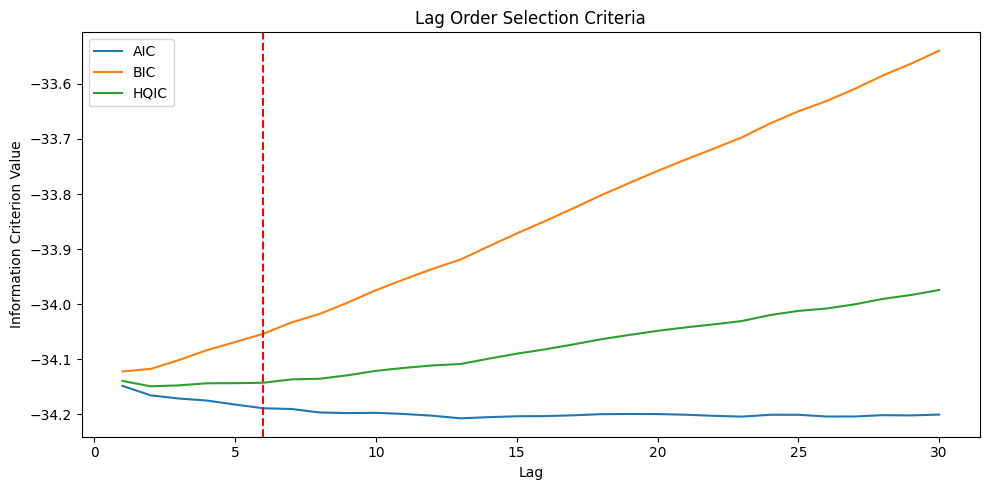

In [15]:
import pandas as pd
from statsmodels.tsa.api import VAR
import matplotlib.pyplot as plt

# load csv ProcessedData.csv
data_optimal_lag = pd.read_csv("ProcessedData.csv", index_col=0)
data_optimal_lag.index = pd.to_datetime(data_optimal_lag.index)
# for now we will only use VIX Close, WTI Spot Price, IT Adj Close_Return, HC Adj Close_Return AND CD Adj Close_Return, IT Volume, HD Volume, CD Volume
data_optimal_lag = data_optimal_lag[['VIX Close', 'WTI Log Daily Change', 'IT_Log_Return', 'HC_Log_Return', 'CD_Log_Return', 'IT Volume', 'HC Volume', 'CD Volume']]
# rename VIX Close to VIX, IT Adj Close_Return to IT Daily Return, HC Adj Close_Return to HC Daily Return, CD Adj Close_Return to CD Daily Return
data_optimal_lag.rename(columns={'VIX Close': 'VIX'})#, 'IT_Return': 'IT Daily Return', 'HC Adj Close_Return': 'HC Daily Return', 'CD Adj Close_Return': 'CD Daily Return'}, inplace=True)
# remame HC Daily Return to Health Care Daily Return, CD Daaily Return to Consumer Discretionary Daily Return, IT Daily Return to Information Technology Daily Return
data_optimal_lag.rename(columns={'HC_Log_Return': 'Health Care Daily Log Return', 'CD_Log_Return': 'Consumer Discretionary Daily Log Return', 'IT_Log_Return': 'Information Technology Daily Log Return'}, inplace=True)
data_optimal_lag.head()

# Define sectors
sectors = ['Health Care Daily Log Return', 'Information Technology Daily Log Return', 'Consumer Discretionary Daily Log Return']



# Convert dates to datetime format
data_optimal_lag.index = pd.to_datetime(data_optimal_lag.index)
 # 



data_optimal_lag = data_optimal_lag.dropna()


# Select relevant columns for VAR model
columns = [
    'VIX Close',
    'WTI Log Daily Change',
    'Information Technology Daily Log Return',
    'Health Care Daily Log Return',
    'Consumer Discretionary Daily Log Return'
]

# Drop missing values (important for VAR)
data_lag = data_optimal_lag[columns].dropna()

# Fit VAR model to determine optimal lag length
model = VAR(data_lag)

# Perform lag order selection up to a reasonable max (e.g., 30 lags)
lag_selection = model.select_order(maxlags=30)

# Print lag order criteria
print("Lag Order Selection Results:")
print(lag_selection.summary())

# Optional: plot the information criteria
ic_data_optimal_lag = pd.DataFrame({
    'AIC': [model.fit(i).aic for i in range(1, 31)],
    'BIC': [model.fit(i).bic for i in range(1, 31)],
    'HQIC': [model.fit(i).hqic for i in range(1, 31)]
}, index=range(1, 31))

ic_data_optimal_lag.plot(figsize=(10, 5), title='Lag Order Selection Criteria')
plt.xlabel("Lag")
plt.ylabel("Information Criterion Value")
# make a -- line in red color for lag = 6 to show that it is the middle ground between the three criteria
plt.axvline(x=6, color='red', linestyle='--', label='Lag = 6')
plt.grid(False)
plt.tight_layout()
plt.show()


As described in the thesis, to take into account all three measures and still also take the practicability aspect into account, the chosen lag is set to 6

For the rolling window and optimal max_lag, the joint Granger-Causality and VIX- and WTI-only Granger Causality are calculated

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.api import VAR

# Configuration
rolling_window = 252  # ≈ 1 year
max_lag = 6
sectors = [
    'Information Technology Daily Log Return',
    'Health Care Daily Log Return',
    'Consumer Discretionary Daily Log Return'
]
causing_vars = ['WTI Log Daily Change', 'VIX Close']

# Containers for results
rolling_dates = []
joint_pvals = {sector: [] for sector in sectors}
oil_pvals = {sector: [] for sector in sectors}
vix_pvals = {sector: [] for sector in sectors}

# Rolling window Granger causality
for start in range(len(data) - rolling_window):
    end = start + rolling_window
    window_data = data.iloc[start:end].dropna()
    rolling_dates.append(data.index[end])  # store the end date

    for sector in sectors:
        try:
            temp_data = window_data[causing_vars + [sector]].copy()
            model = VAR(temp_data)
            #fitted = model.fit(maxlags=max_lag, ic='bic')
            fitted = model.fit(maxlags=6, ic='aic')

            # Joint test
            joint = fitted.test_causality(causing=causing_vars, caused=sector, kind='f').pvalue
            # Individual tests
            oil_only = fitted.test_causality(causing=['WTI Log Daily Change'], caused=sector, kind='f').pvalue
            vix_only = fitted.test_causality(causing=['VIX Close'], caused=sector, kind='f').pvalue

        except Exception as e:
            joint, oil_only, vix_only = np.nan, np.nan, np.nan

        joint_pvals[sector].append(joint)
        oil_pvals[sector].append(oil_only)
        vix_pvals[sector].append(vix_only)

# Convert to DataFrames
joint_df = pd.DataFrame(joint_pvals, index=rolling_dates)
oil_df = pd.DataFrame(oil_pvals, index=rolling_dates)
vix_df = pd.DataFrame(vix_pvals, index=rolling_dates)


C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g

Together with the defined Global Periods of Crisis in the dataset, the rolling p-values are plotted to show significance over time

C:\Users\nicol\AppData\Local\Temp\ipykernel_4088\1010264507.py:79: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0)


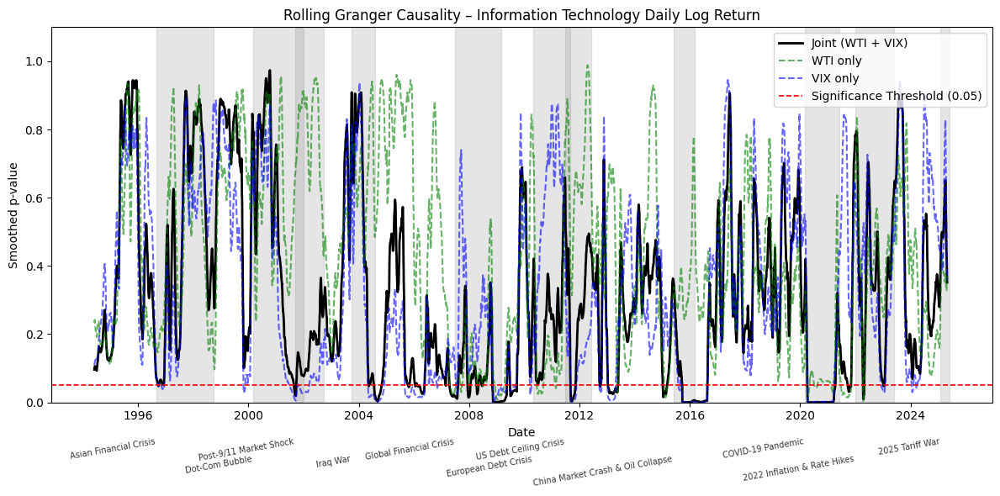

C:\Users\nicol\AppData\Local\Temp\ipykernel_4088\1010264507.py:79: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0)


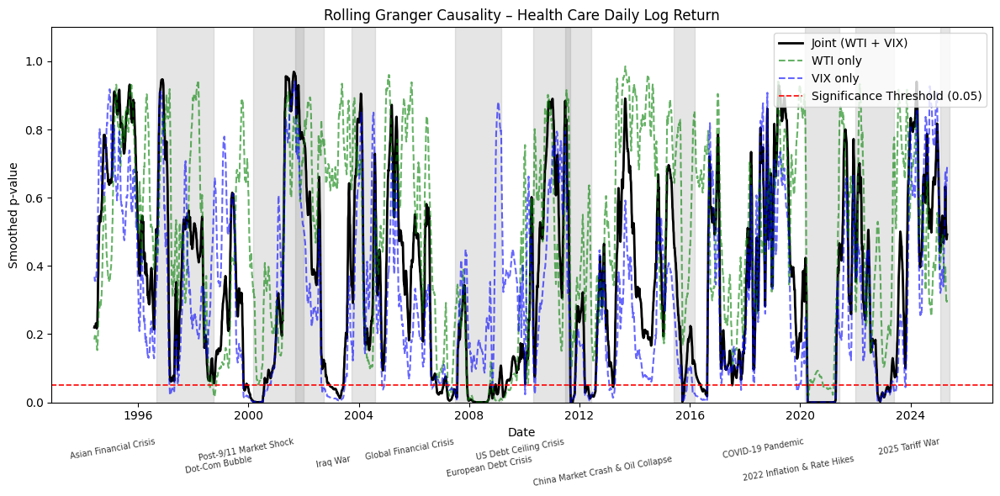

C:\Users\nicol\AppData\Local\Temp\ipykernel_4088\1010264507.py:79: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0)


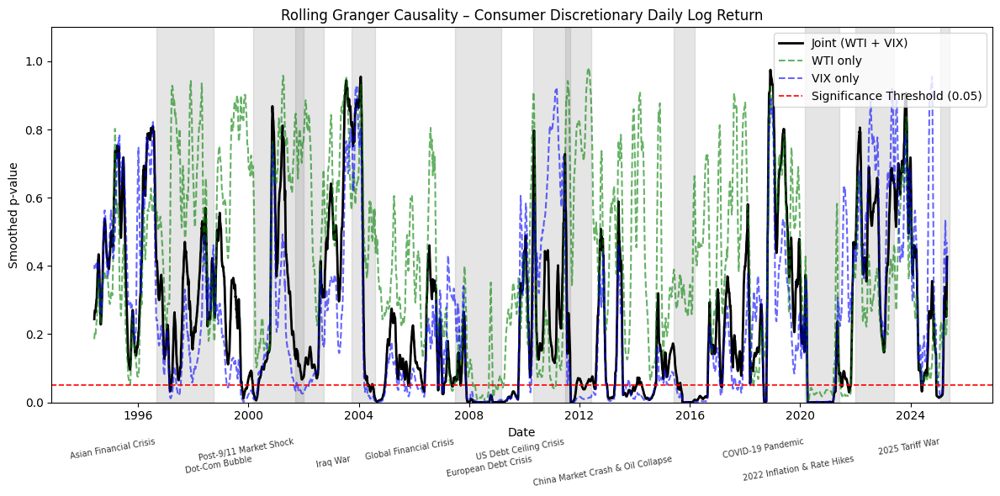

In [17]:
# First, convert string dates in crisis periods to datetime
import matplotlib.pyplot as plt
import pandas as pd

# Ensure your DataFrame index is datetime
joint_df.index = pd.to_datetime(joint_df.index)
oil_df.index = pd.to_datetime(oil_df.index)
vix_df.index = pd.to_datetime(vix_df.index)

# Define crisis periods (already provided)
high_uncertainty_periods = [
    ("Asian Financial Crisis", "1996-09-01", "1998-10-01"),
    ("Dot-Com Bubble", "2000-03-01", "2002-10-01"),
    ("Post-9/11 Market Shock", "2001-09-11", "2001-12-31"),
    ("Iraq War", "2003-10-01", "2004-07-31"),
    ("Global Financial Crisis", "2007-07-01", "2009-03-01"),
    ("European Debt Crisis", "2010-05-01", "2012-06-01"),
    ("US Debt Ceiling Crisis", "2011-07-01", "2011-08-31"),
    ("China Market Crash & Oil Collapse", "2015-06-01", "2016-03-01"),
    ("COVID-19 Pandemic", "2020-03-01", "2021-06-01"),
    ("2022 Inflation & Rate Hikes", "2022-01-01", "2023-06-01"),
    ("2025 Tariff War", "2025-02-01", "2025-06-01")
]

from datetime import timedelta

crisis_periods = [(name, pd.to_datetime(start), pd.to_datetime(end)) for name, start, end in high_uncertainty_periods]

for sector in sectors:
    fig, ax = plt.subplots(figsize=(12, 6))

    # Smooth series
    joint_smoothed = joint_df[sector].rolling(20).mean()
    oil_smoothed = oil_df[sector].rolling(20).mean()
    vix_smoothed = vix_df[sector].rolling(20).mean()

    # Plot curves
    ax.plot(joint_df.index, joint_smoothed, color="black", label="Joint (WTI + VIX)", linewidth=2.0)
    ax.plot(oil_df.index, oil_smoothed, color="green", linestyle='--', alpha=0.6, label="WTI only", linewidth=1.5)
    ax.plot(vix_df.index, vix_smoothed, color="blue", linestyle='--', alpha=0.6, label="VIX only", linewidth=1.5)

    # Significance threshold
    ax.axhline(y=0.05, color='red', linestyle='--', linewidth=1.2, label="Significance Threshold (0.05)")

    # Label placement logic
    last_label_date = pd.Timestamp("1900-01-01")
    min_gap_days = 40
    y_shift_up = True  # toggle to stagger

    for name, start, end in crisis_periods:
        ax.axvspan(start, end, color='gray', alpha=0.2)

        # Horizontal cushion logic
        if (start - last_label_date).days < min_gap_days:
            label_x = last_label_date - timedelta(days=min_gap_days)
        else:
            label_x = start - timedelta(days=5)
        last_label_date = label_x

        # Vertical staggering
        y_offset = -30 if y_shift_up else -45
        y_shift_up = not y_shift_up

        ax.annotate(name,
                    xy=(label_x, 0),
                    xycoords=('data', 'axes fraction'),
                    xytext=(0, y_offset),
                    textcoords='offset points',
                    ha='right', va='top',
                    fontsize=7, rotation=10, alpha=0.8)

    # Plot settings
    ax.set_title(f"Rolling Granger Causality – {sector}")
    ax.set_ylabel("Smoothed p-value")
    ax.set_xlabel("Date")
    ax.legend(loc="upper right")
    ax.grid(False)
    ax.set_ylim(0, 1.1)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    plt.tight_layout()
    plt.show()



In [18]:
# Calculating the percentage of significant Granger-Causality days
granger_types = {
    'Joint (WTI + VIX)': joint_df,
    'WTI only': oil_df,
    'VIX only': vix_df
}

# Threshold for significance
significance_level = 0.05

# 1. Compute % significance full, pre-GFC, post-GFC
summary_stats = []

for label, df in granger_types.items():
    for sector in df.columns:
        smoothed = df[sector].rolling(20).mean()
        total = smoothed.dropna()
        pre = smoothed[smoothed.index < '2008-01-01'].dropna()
        post = smoothed[smoothed.index >= '2010-01-01'].dropna()

        summary_stats.append({
            'Granger Type': label,
            'Sector': sector,
            '% Significant (All)': round((total < significance_level).mean() * 100, 2),
            '% Significant (Pre-GFC)': round((pre < significance_level).mean() * 100, 2),
            '% Significant (Post-GFC)': round((post < significance_level).mean() * 100, 2)
        })

summary_df = pd.DataFrame(summary_stats)

In [19]:
summary_df

,Granger Type,Sector,% Significant (All),% Significant (Pre-GFC),% Significant (Post-GFC)
0,Joint (WTI + VIX),Information Technology Daily Log Return,15.84,8.24,18.64
1,Joint (WTI + VIX),Health Care Daily Log Return,17.69,13.86,15.77
2,Joint (WTI + VIX),Consumer Discretionary Daily Log Return,24.45,10.09,28.65
3,WTI only,Information Technology Daily Log Return,6.01,2.27,7.48
4,WTI only,Health Care Daily Log Return,7.37,2.91,2.89
5,WTI only,Consumer Discretionary Daily Log Return,7.71,0.91,9.65
6,VIX only,Information Technology Daily Log Return,19.03,16.92,18.85
7,VIX only,Health Care Daily Log Return,18.75,17.89,21.87
8,VIX only,Consumer Discretionary Daily Log Return,31.71,21.54,33.19


Statistical tests to determine sectoral difference and difference between type of Granger-Causality used (Joint, VIX-only, WTI-only)

In [20]:
import pandas as pd
import itertools
from scipy.stats import mannwhitneyu

# Your actual dataframes
granger_types = {
    'Joint (WTI + VIX)': joint_df,
    'WTI only': oil_df,
    'VIX only': vix_df
}

sectors = joint_df.columns.tolist()

periods = {
    'All': lambda df: df.dropna(),
    'Pre-GFC': lambda df: df[df.index < '2008-01-01'].dropna(),
    'Post-GFC': lambda df: df[df.index >= '2010-01-01'].dropna()
}

# Function to run Mann-Whitney test
def compare_groups(g1, g2):
    stat, p = mannwhitneyu(g1, g2, alternative='two-sided')
    return round(stat, 2), round(p, 4)

# 1. Compare sectors within each Granger type and period
sector_results = []
for gr_type, df in granger_types.items():
    for period_name, period_filter in periods.items():
        for s1, s2 in itertools.combinations(sectors, 2):
            g1 = period_filter(df[s1].rolling(20).mean())
            g2 = period_filter(df[s2].rolling(20).mean())
            if len(g1) > 0 and len(g2) > 0:
                stat, p = compare_groups(g1, g2)
                sector_results.append({
                    'Granger Type': gr_type,
                    'Period': period_name,
                    'Sector 1': s1,
                    'Sector 2': s2,
                    'Statistic': stat,
                    'p-value': p
                })

sector_df = pd.DataFrame(sector_results)

# 2. Compare Granger types within each sector and period
type_results = []
for sector in sectors:
    for period_name, period_filter in periods.items():
        for t1, t2 in itertools.combinations(granger_types.keys(), 2):
            g1 = period_filter(granger_types[t1][sector].rolling(20).mean())
            g2 = period_filter(granger_types[t2][sector].rolling(20).mean())
            if len(g1) > 0 and len(g2) > 0:
                stat, p = compare_groups(g1, g2)
                type_results.append({
                    'Sector': sector,
                    'Period': period_name,
                    'Granger Type 1': t1,
                    'Granger Type 2': t2,
                    'Statistic': stat,
                    'p-value': p
                })

type_df = pd.DataFrame(type_results)

In [21]:
sector_df

,Granger Type,Period,Sector 1,Sector 2,Statistic,p-value
0,Joint (WTI + VIX),All,Information Technology Daily Log Return,Health Care Daily Log Return,28128479.0,0.0000
1,Joint (WTI + VIX),All,Information Technology Daily Log Return,Consumer Discretionary Daily Log Return,34651887.0,0.0000
2,Joint (WTI + VIX),All,Health Care Daily Log Return,Consumer Discretionary Daily Log Return,36093894.0,0.0000
3,Joint (WTI + VIX),Pre-GFC,Information Technology Daily Log Return,Health Care Daily Log Return,5732913.0,0.6184
4,Joint (WTI + VIX),Pre-GFC,Information Technology Daily Log Return,Consumer Discretionary Daily Log Return,6563248.0,0.0000
5,Joint (WTI + VIX),Pre-GFC,Health Care Daily Log Return,Consumer Discretionary Daily Log Return,6655434.0,0.0000
6,Joint (WTI + VIX),Post-GFC,Information Technology Daily Log Return,Health Care Daily Log Return,6265159.0,0.0000
7,Joint (WTI + VIX),Post-GFC,Information Technology Daily Log Return,Consumer Discretionary Daily Log Return,8541507.0,0.0000
8,Joint (WTI + VIX),Post-GFC,Health Care Daily Log Return,Consumer Discretionary Daily Log Return,9378035.0,0.0000
9,WTI only,All,Information Technology Daily Log Return,Health Care Daily Log Return,26003019.0,0.0000


In [22]:
type_df

,Sector,Period,Granger Type 1,Granger Type 2,Statistic,p-value
0,Information Technology Daily Log Return,All,Joint (WTI + VIX),WTI only,22383782.0,0.0000
1,Information Technology Daily Log Return,All,Joint (WTI + VIX),VIX only,29797184.0,0.5922
2,Information Technology Daily Log Return,All,WTI only,VIX only,37071320.0,0.0000
3,Information Technology Daily Log Return,Pre-GFC,Joint (WTI + VIX),WTI only,3860368.0,0.0000
4,Information Technology Daily Log Return,Pre-GFC,Joint (WTI + VIX),VIX only,6484543.0,0.0000
5,Information Technology Daily Log Return,Pre-GFC,WTI only,VIX only,8241594.0,0.0000
6,Information Technology Daily Log Return,Post-GFC,Joint (WTI + VIX),WTI only,5975414.0,0.0000
7,Information Technology Daily Log Return,Post-GFC,Joint (WTI + VIX),VIX only,6716940.0,0.0000
8,Information Technology Daily Log Return,Post-GFC,WTI only,VIX only,7986342.0,0.0000
9,Health Care Daily Log Return,All,Joint (WTI + VIX),WTI only,21383120.0,0.0000


### Granger-Causality Significance per Year

In [23]:
from statsmodels.tsa.api import VAR

# Extract years from index
data['Year'] = data.index.year
years = data['Year'].unique()

# Store p-values
yearly_pvals = {sector: {'joint': [], 'oil': [], 'vix': [], 'year': []} for sector in sectors}

for year in years:
    yearly_data = data[data['Year'] == year].dropna()

    if len(yearly_data) < 100:
        continue  # Skip years with too little data

    for sector in sectors:
        try:
            vars_subset = ['WTI Log Daily Change', 'VIX Close', sector]
            model_data = yearly_data[vars_subset]
            model = VAR(model_data)
            fitted = model.fit(maxlags=max_lag, ic='bic')

            joint = fitted.test_causality(causing=['WTI Log Daily Change', 'VIX Close'], caused=sector, kind='f').pvalue
            oil_only = fitted.test_causality(causing=['WTI Log Daily Change'], caused=sector, kind='f').pvalue
            vix_only = fitted.test_causality(causing=['VIX Close'], caused=sector, kind='f').pvalue

            yearly_pvals[sector]['joint'].append(joint)
            yearly_pvals[sector]['oil'].append(oil_only)
            yearly_pvals[sector]['vix'].append(vix_only)
            yearly_pvals[sector]['year'].append(year)

        except Exception as e:
            print(f"Skipping {sector} in {year}: {e}")


C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g

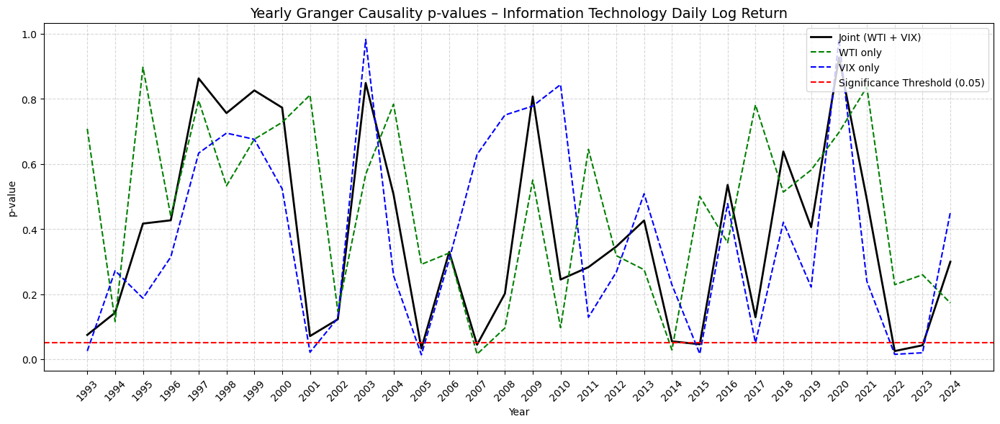

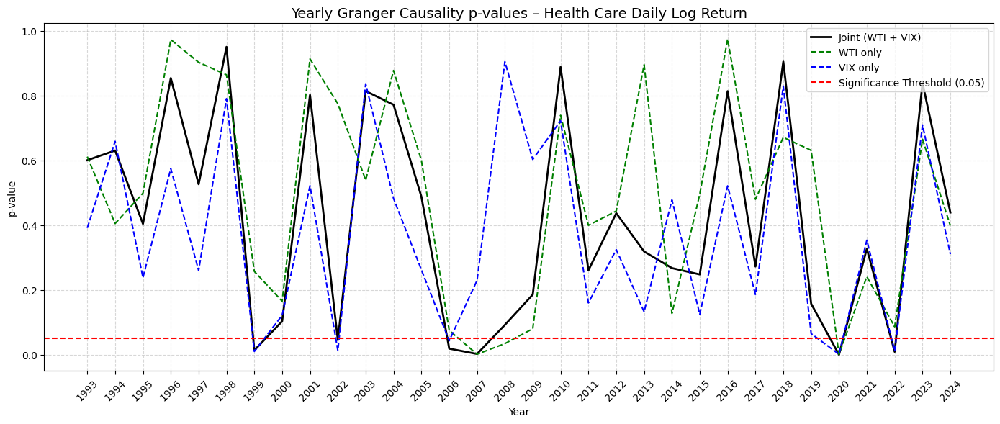

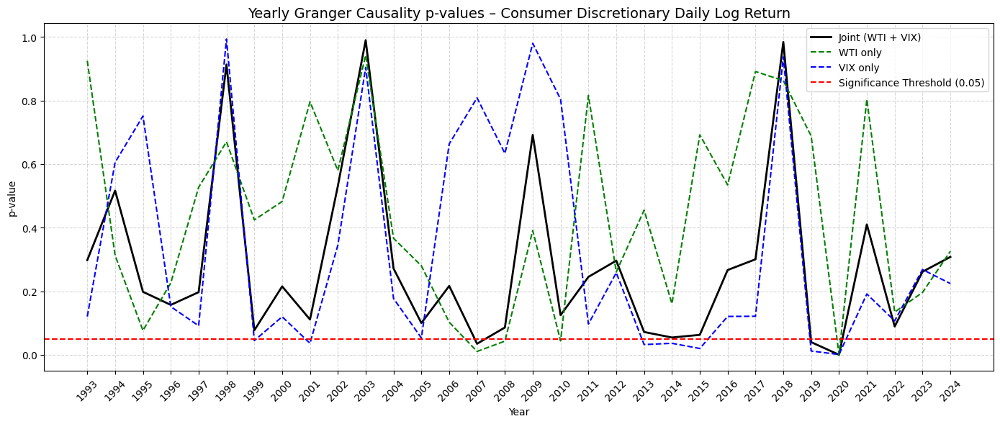

In [24]:
for sector in sectors:
    df = pd.DataFrame(yearly_pvals[sector])
    
    plt.figure(figsize=(14, 6))
    
    plt.plot(df['year'], df['joint'], label="Joint (WTI + VIX)", color='black', linewidth=2.0)
    plt.plot(df['year'], df['oil'], label="WTI only", color='green', linestyle='--', linewidth=1.5)
    plt.plot(df['year'], df['vix'], label="VIX only", color='blue', linestyle='--', linewidth=1.5)

    plt.axhline(0.05, color='red', linestyle='--', label="Significance Threshold (0.05)")
    plt.title(f"Yearly Granger Causality p-values – {sector}", fontsize=14)
    plt.xlabel("Year")
    plt.ylabel("p-value")
    plt.legend(loc="upper right")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(df['year'], rotation=45)
    plt.tight_layout()
    plt.show()


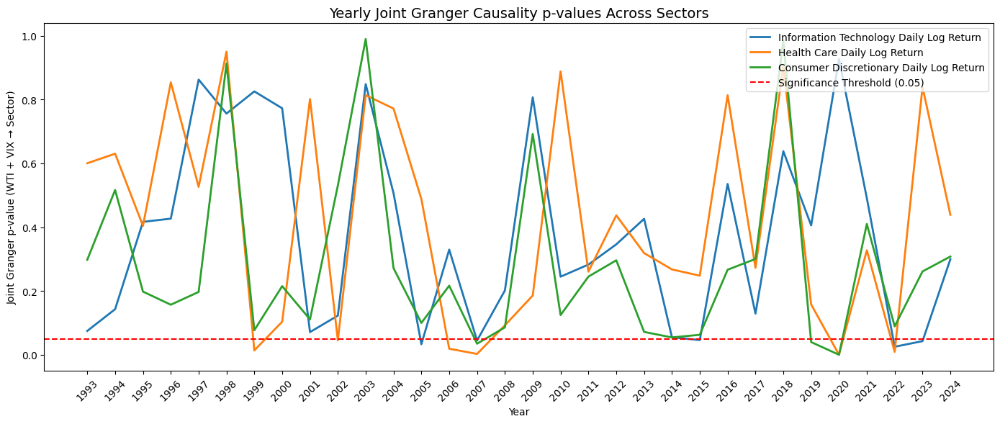

In [25]:
# Creating a single DataFrame for plotting across sectors
combined_df = pd.DataFrame()

for sector in sectors:
    df = pd.DataFrame(yearly_pvals[sector])
    df['Sector'] = sector
    combined_df = pd.concat([combined_df, df], ignore_index=True)

# Plot: Compare joint p-values across sectors
plt.figure(figsize=(14, 6))

for sector in sectors:
    sector_df = combined_df[combined_df['Sector'] == sector]
    plt.plot(sector_df['year'], sector_df['joint'], label=sector, linewidth=2)

plt.axhline(0.05, color='red', linestyle='--', label='Significance Threshold (0.05)')
plt.title("Yearly Joint Granger Causality p-values Across Sectors", fontsize=14)
plt.xlabel("Year")
plt.ylabel("Joint Granger p-value (WTI + VIX → Sector)")
plt.legend(loc="upper right")
#plt.grid(True, linestyle='--', alpha=0.5)
plt.grid(False)
plt.xticks(sector_df['year'], rotation=45)
plt.tight_layout()
plt.show()


## Generalized Impulse Responses

C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g

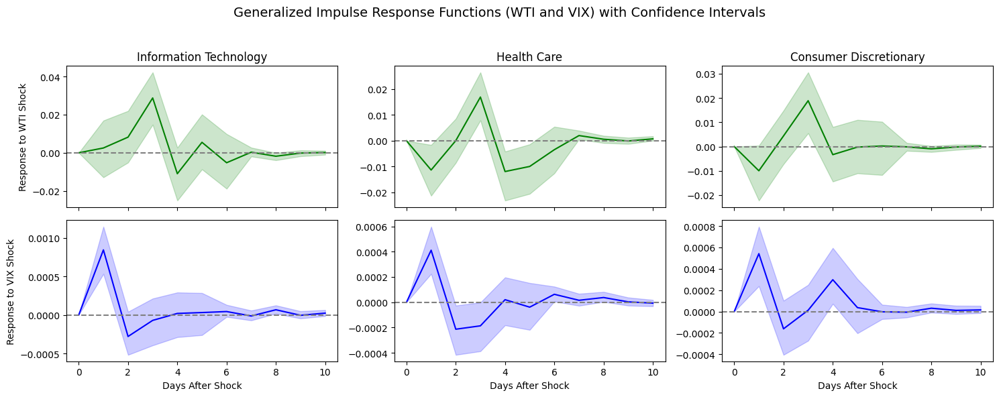

In [26]:
from statsmodels.tsa.api import VAR
import numpy as np
import matplotlib.pyplot as plt

# === CONFIG ===
sectors = [
    'Information Technology Daily Log Return',
    'Health Care Daily Log Return',
    'Consumer Discretionary Daily Log Return'
]
shock_vars = ['WTI Log Daily Change', 'VIX Close']
n_steps = 10
n_repl = 300
signif = 0.05

# === PLOT SETUP ===
fig, axs = plt.subplots(2, 3, figsize=(15, 6), sharex=True)
x = np.arange(n_steps + 1)

for col, sector in enumerate(sectors):
    model_data = data[shock_vars + [sector]].dropna()
    model = VAR(model_data)
    fitted = model.fit(maxlags=6, ic='aic')
    irf = fitted.irf(n_steps)

    sector_idx = model_data.columns.get_loc(sector)

    girfs = irf.irfs
    lower, upper = irf.errband_mc(orth=False, repl=n_repl, signif=signif)

    # WTI-only
    wti_irf = girfs[:, sector_idx, 0]
    wti_low = lower[:, sector_idx, 0]
    wti_high = upper[:, sector_idx, 0]

    # VIX-only
    vix_irf = girfs[:, sector_idx, 1]
    vix_low = lower[:, sector_idx, 1]
    vix_high = upper[:, sector_idx, 1]

    # --- Plot: WTI (row 0)
    ax = axs[0, col]
    ax.plot(x, wti_irf, color='green', label="WTI Shock")
    ax.fill_between(x, wti_low, wti_high, color='green', alpha=0.2)
    ax.axhline(0, color='gray', linestyle='--')
    ax.set_title(sector.replace(" Daily Log Return", ""))
    if col == 0:
        ax.set_ylabel("Response to WTI Shock")
    ax.grid(False)

    # --- Plot: VIX (row 1)
    ax = axs[1, col]
    ax.plot(x, vix_irf, color='blue', label="VIX Shock")
    ax.fill_between(x, vix_low, vix_high, color='blue', alpha=0.2)
    ax.axhline(0, color='gray', linestyle='--')
    if col == 0:
        ax.set_ylabel("Response to VIX Shock")
    ax.set_xlabel("Days After Shock")
    ax.grid(False)

fig.suptitle("Generalized Impulse Response Functions (WTI and VIX) with Confidence Intervals", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [27]:
from scipy.stats import wilcoxon, mannwhitneyu
import pandas as pd
from itertools import combinations


from statsmodels.tsa.api import VAR
import numpy as np
from tqdm import tqdm

# === SETTINGS ===
sectors = [
    'Information Technology Daily Log Return',
    'Health Care Daily Log Return',
    'Consumer Discretionary Daily Log Return'
]
shock_vars = ['WTI Log Daily Change', 'VIX Close']
n_steps = 10
n_bootstrap = 300

# Initialize storage
girf_boot_wti = {}
girf_boot_vix = {}

# Function to simulate GIRFs for bootstrapped confidence intervals
def simulate_girf_bootstrap(model_data, shock_idx, sector_idx):
    model = VAR(model_data)
    fitted = model.fit(maxlags=6, ic='aic')
    p = fitted.k_ar
    k = fitted.neqs

    beta = fitted.coefs
    intercept = fitted.intercept
    resids = fitted.resid.dropna().values
    initial_values = model_data.values[-p:]

    responses = []

    for _ in tqdm(range(n_bootstrap), desc="Bootstrapping"):
        base = initial_values.copy()
        shock = initial_values.copy()

        eps_stream = resids[np.random.choice(len(resids), size=n_steps+1, replace=True)]

        base_path = []
        shock_path = []

        for t in range(n_steps + 1):
            lag_base = sum(beta[lag - 1] @ base[-lag] for lag in range(1, p + 1))
            lag_shock = sum(beta[lag - 1] @ shock[-lag] for lag in range(1, p + 1))

            shock_vector = np.zeros(k)
            if t == 0:
                shock_vector[shock_idx] = resids.std(axis=0)[shock_idx]

            next_base = intercept + lag_base + eps_stream[t]
            next_shock = intercept + lag_shock + eps_stream[t] + shock_vector

            base_path.append(next_base[sector_idx])
            shock_path.append(next_shock[sector_idx])

            base = np.vstack([base, next_base])
            shock = np.vstack([shock, next_shock])

        responses.append(np.array(shock_path) - np.array(base_path))

    return np.array(responses)

# Running for each sector and storing in dictionaries
for sector in sectors:
    model_data = data[shock_vars + [sector]].dropna()
    sector_idx = model_data.columns.get_loc(sector)

    print(f"Bootstrapping WTI for {sector}")
    girf_boot_wti[sector] = simulate_girf_bootstrap(model_data, shock_idx=0, sector_idx=sector_idx)

    print(f"Bootstrapping VIX for {sector}")
    girf_boot_vix[sector] = simulate_girf_bootstrap(model_data, shock_idx=1, sector_idx=sector_idx)


# Parameters
n_steps = 10
step_to_test = 1  # Day 1 after shock
sectors = [
    'Information Technology Daily Log Return',
    'Health Care Daily Log Return',
    'Consumer Discretionary Daily Log Return'
]

# 1. WTI vs VIX per sector (paired test)
wti_vs_vix_results = []
for sector in sectors:
    wti_boot = girf_boot_wti[sector][:, step_to_test]
    vix_boot = girf_boot_vix[sector][:, step_to_test]
    stat, p = wilcoxon(wti_boot, vix_boot)
    wti_vs_vix_results.append({
        "Sector": sector.replace(" Daily Log Return", ""),
        "Test": "WTI vs VIX",
        "Statistic": stat,
        "p-value": round(p, 4)
    })

# 2. Sector-to-sector comparisons for each shock
sector_pairs = list(combinations(sectors, 2))
shock_comparisons = []

for shock_name, dist in [("WTI", girf_boot_wti), ("VIX", girf_boot_vix)]:
    for (sec1, sec2) in sector_pairs:
        sample1 = dist[sec1][:, step_to_test]
        sample2 = dist[sec2][:, step_to_test]
        stat, p = mannwhitneyu(sample1, sample2, alternative='two-sided')
        shock_comparisons.append({
            "Shock": shock_name,
            "Sector 1": sec1.replace(" Daily Log Return", ""),
            "Sector 2": sec2.replace(" Daily Log Return", ""),
            "Statistic": stat,
            "p-value": round(p, 4)
        })

# Convert to DataFrames for easy display or export
df_wti_vs_vix = pd.DataFrame(wti_vs_vix_results)
df_sector_comparisons = pd.DataFrame(shock_comparisons)

print("=== WTI vs VIX Tests ===")
print(df_wti_vs_vix)

print("\n=== Sector Differences per Shock ===")
print(df_sector_comparisons)


C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Bootstrapping WTI for Information Technology Daily Log Return


Bootstrapping: 100%|██████████| 300/300 [00:00<00:00, 3068.11it/s]
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Bootstrapping VIX for Information Technology Daily Log Return


Bootstrapping: 100%|██████████| 300/300 [00:00<00:00, 2840.96it/s]
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Bootstrapping WTI for Health Care Daily Log Return


Bootstrapping: 100%|██████████| 300/300 [00:00<00:00, 2828.89it/s]
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Bootstrapping VIX for Health Care Daily Log Return


Bootstrapping: 100%|██████████| 300/300 [00:00<00:00, 3024.59it/s]
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Bootstrapping WTI for Consumer Discretionary Daily Log Return


Bootstrapping: 100%|██████████| 300/300 [00:00<00:00, 3021.49it/s]
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Bootstrapping VIX for Consumer Discretionary Daily Log Return


Bootstrapping: 100%|██████████| 300/300 [00:00<00:00, 2927.78it/s]


=== WTI vs VIX Tests ===
                   Sector        Test  Statistic  p-value
0  Information Technology  WTI vs VIX        0.0      0.0
1             Health Care  WTI vs VIX        0.0      0.0
2  Consumer Discretionary  WTI vs VIX        0.0      0.0

=== Sector Differences per Shock ===
  Shock                Sector 1                Sector 2  Statistic  p-value
0   WTI  Information Technology             Health Care    90000.0      0.0
1   WTI  Information Technology  Consumer Discretionary    90000.0      0.0
2   WTI             Health Care  Consumer Discretionary        0.0      0.0
3   VIX  Information Technology             Health Care    90000.0      0.0
4   VIX  Information Technology  Consumer Discretionary    90000.0      0.0
5   VIX             Health Care  Consumer Discretionary        0.0      0.0


Cumulative:

C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g

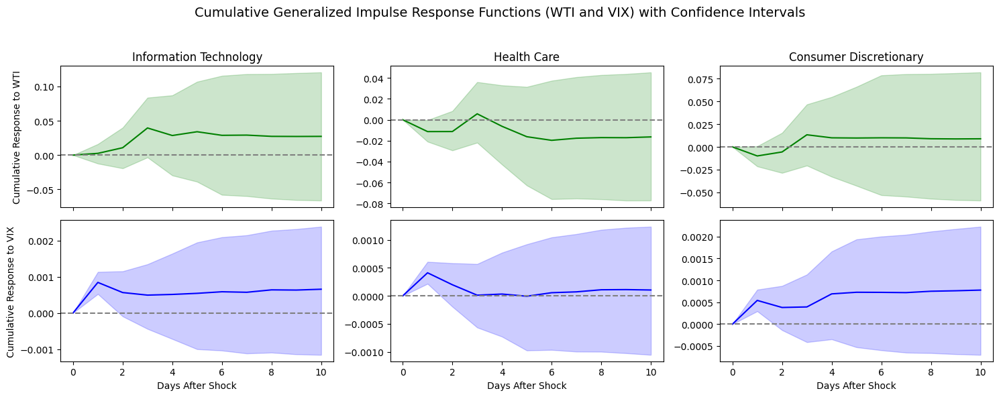

In [28]:
from statsmodels.tsa.api import VAR
import numpy as np
import matplotlib.pyplot as plt

# === CONFIG ===
sectors = [
    'Information Technology Daily Log Return',
    'Health Care Daily Log Return',
    'Consumer Discretionary Daily Log Return'
]
shock_vars = ['WTI Log Daily Change', 'VIX Close']
n_steps = 10
n_repl = 300
signif = 0.05

# === PLOT SETUP ===
fig, axs = plt.subplots(2, 3, figsize=(15, 6), sharex=True)
x = np.arange(n_steps + 1)

for col, sector in enumerate(sectors):
    model_data = data[shock_vars + [sector]].dropna()
    model = VAR(model_data)
    fitted = model.fit(maxlags=6, ic='aic')
    irf = fitted.irf(n_steps)

    sector_idx = model_data.columns.get_loc(sector)

    girfs = irf.irfs
    lower, upper = irf.errband_mc(orth=False, repl=n_repl, signif=signif)

    # WTI-only cumulative
    wti_irf = np.cumsum(girfs[:, sector_idx, 0])
    wti_low = np.cumsum(lower[:, sector_idx, 0])
    wti_high = np.cumsum(upper[:, sector_idx, 0])

    # VIX-only cumulative
    vix_irf = np.cumsum(girfs[:, sector_idx, 1])
    vix_low = np.cumsum(lower[:, sector_idx, 1])
    vix_high = np.cumsum(upper[:, sector_idx, 1])

    # --- Plot: WTI (row 0)
    ax = axs[0, col]
    ax.plot(x, wti_irf, color='green', label="WTI Shock")
    ax.fill_between(x, wti_low, wti_high, color='green', alpha=0.2)
    ax.axhline(0, color='gray', linestyle='--')
    ax.set_title(sector.replace(" Daily Log Return", ""))
    if col == 0:
        ax.set_ylabel("Cumulative Response to WTI")
    ax.grid(False)

    # --- Plot: VIX (row 1)
    ax = axs[1, col]
    ax.plot(x, vix_irf, color='blue', label="VIX Shock")
    ax.fill_between(x, vix_low, vix_high, color='blue', alpha=0.2)
    ax.axhline(0, color='gray', linestyle='--')
    if col == 0:
        ax.set_ylabel("Cumulative Response to VIX")
    ax.set_xlabel("Days After Shock")
    ax.grid(False)

fig.suptitle("Cumulative Generalized Impulse Response Functions (WTI and VIX) with Confidence Intervals", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [29]:
# print standard deviation value used in GIRF for WTI and VIX shocks

print(f"WTI Shock Std Dev: {np.std(data['WTI Log Daily Change'].dropna())}")
print(f"VIX Shock Std Dev: {np.std(data['VIX Close'].dropna())}")

WTI Shock Std Dev: 0.02635081256519418
VIX Shock Std Dev: 8.082538858051365


#### Plotting the GIRFs for low and high uncertainty categories

C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g

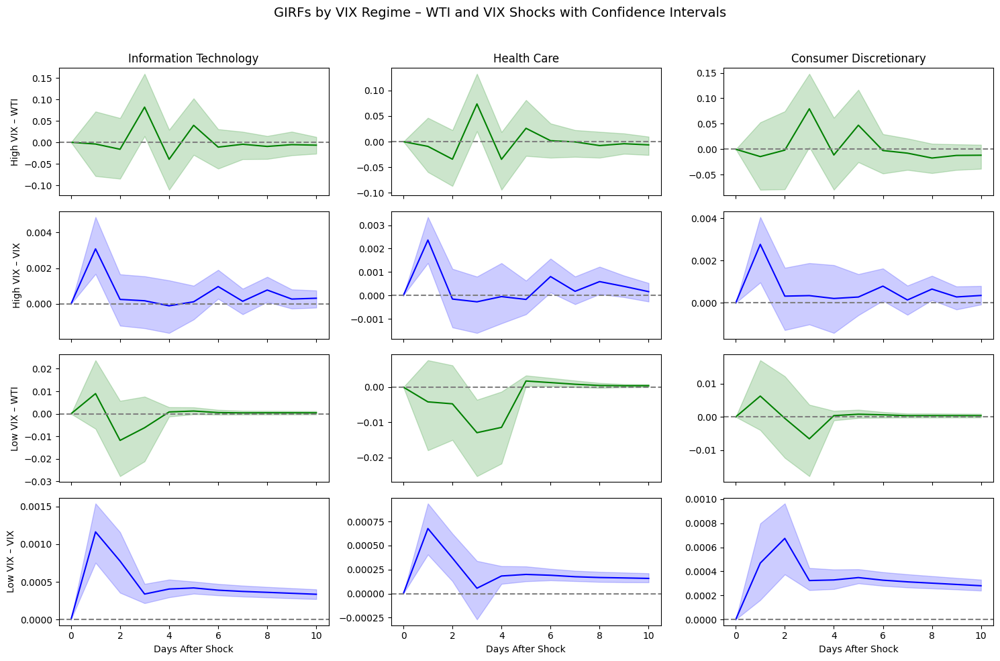

In [30]:
from statsmodels.tsa.api import VAR
import numpy as np
import matplotlib.pyplot as plt

# === CONFIG ===
sectors = [
    'Information Technology Daily Log Return',
    'Health Care Daily Log Return',
    'Consumer Discretionary Daily Log Return'
]
shock_vars = ['WTI Log Daily Change', 'VIX Close']
n_steps = 10
n_repl = 300
signif = 0.05
x = np.arange(n_steps + 1)

# === REGIME SPLIT ===
high_vix = data[data['VIX Close'] > 40]
low_vix = data[data['VIX Close'] <= 20]
regimes = {'High VIX': high_vix, 'Low VIX': low_vix}

# === PLOT SETUP ===
fig, axs = plt.subplots(4, 3, figsize=(15, 10), sharex=True)
row_labels = ['High VIX – WTI', 'High VIX – VIX', 'Low VIX – WTI', 'Low VIX – VIX']

for col, sector in enumerate(sectors):
    for regime_i, (regime_name, subset) in enumerate(regimes.items()):
        model_data = subset[shock_vars + [sector]].dropna()
        if len(model_data) < 50:
            axs[regime_i * 2, col].text(0.5, 0.5, 'Too few observations', ha='center')
            axs[regime_i * 2, col].axis('off')
            axs[regime_i * 2 + 1, col].axis('off')
            continue

        model = VAR(model_data)
        fitted = model.fit(maxlags=6, ic='aic')
        irf = fitted.irf(n_steps)
        girfs = irf.irfs
        lower, upper = irf.errband_mc(orth=False, repl=n_repl, signif=signif)

        sector_idx = model_data.columns.get_loc(sector)

        # WTI
        wti_irf = girfs[:, sector_idx, 0]
        wti_low = lower[:, sector_idx, 0]
        wti_high = upper[:, sector_idx, 0]

        # VIX
        vix_irf = girfs[:, sector_idx, 1]
        vix_low = lower[:, sector_idx, 1]
        vix_high = upper[:, sector_idx, 1]

        # Plot WTI (row 0 or 2)
        ax = axs[regime_i * 2, col]
        ax.plot(x, wti_irf, color='green', label="WTI Shock")
        ax.fill_between(x, wti_low, wti_high, color='green', alpha=0.2)
        ax.axhline(0, color='gray', linestyle='--')
        if col == 0:
            ax.set_ylabel(row_labels[regime_i * 2])
        if regime_i == 0:
            ax.set_title(sector.replace(" Daily Log Return", ""))
        ax.grid(False)

        # Plot VIX (row 1 or 3)
        ax = axs[regime_i * 2 + 1, col]
        ax.plot(x, vix_irf, color='blue', label="VIX Shock")
        ax.fill_between(x, vix_low, vix_high, color='blue', alpha=0.2)
        ax.axhline(0, color='gray', linestyle='--')
        if col == 0:
            ax.set_ylabel(row_labels[regime_i * 2 + 1])
        if regime_i == 1:
            ax.set_xlabel("Days After Shock")
        ax.grid(False)

fig.suptitle("GIRFs by VIX Regime – WTI and VIX Shocks with Confidence Intervals", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


## Return Analysis

In [31]:
# Assign "High Uncertainty" based on event classification
data["Uncertainty Regime"] = "Normal Uncertainty"  # Default category

for _, start, end in high_uncertainty_periods:
    mask = (data.index >= pd.to_datetime(start)) & (data.index <= pd.to_datetime(end))
    data.loc[mask, "Uncertainty Regime"] = "High Uncertainty"

In [32]:
# Compute mean and standard deviation
mean_wti = data['WTI Log Daily Change'].mean()
std_wti = data['WTI Log Daily Change'].std()

# Define thresholds
data['WTI Change Category'] = pd.cut(
    data['WTI Log Daily Change'],
    bins=[-np.inf, mean_wti - std_wti, 0, mean_wti + std_wti, np.inf],
    labels=['Negative Big', 'Negative Small', 'Positive Small', 'Positive Big']
)

# Print sample classifications
data[['WTI Log Daily Change', 'WTI Change Category']].dropna().head()

,WTI Log Daily Change,WTI Change Category
Date,,
1993-05-05,0.002937,Positive Small
1993-05-06,0.001465,Positive Small
1993-05-07,-0.002933,Negative Small
1993-05-10,-0.000490,Negative Small
1993-05-11,-0.001961,Negative Small


In [33]:
data['WTI Change Category'].value_counts()

WTI Change Category
Positive Small    3343
Negative Small    3040
Negative Big       849
Positive Big       778
Name: count, dtype: int64

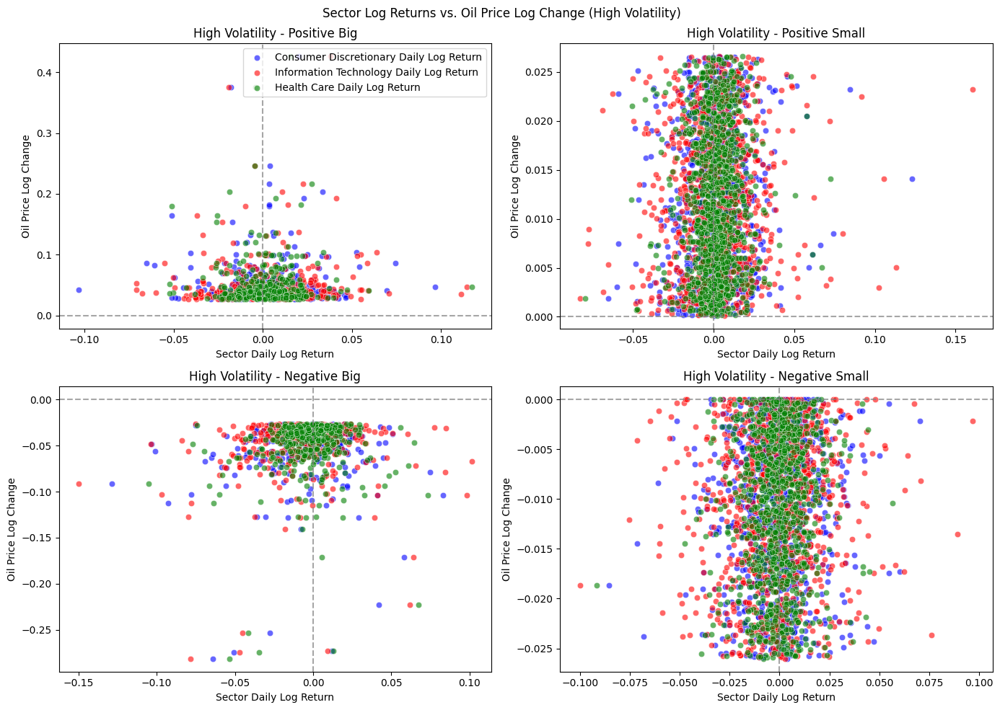

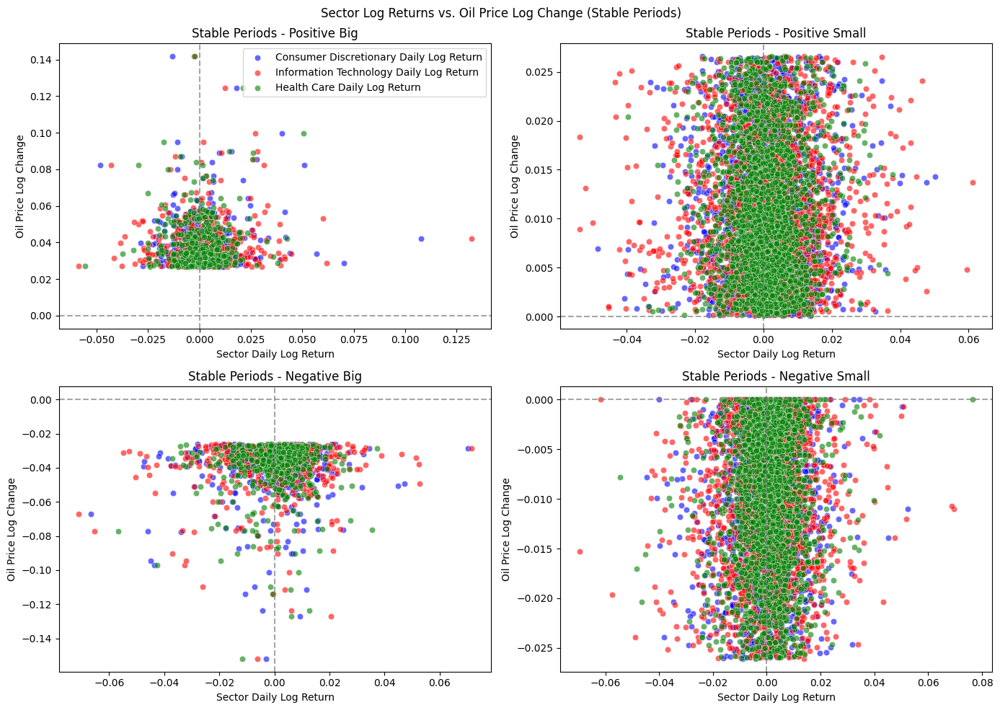

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------- CLASSIFY VOLATILITY REGIMES ----------------------
data['Volatility'] = np.where(data['Uncertainty Regime'] == 'High Uncertainty', 'High Uncertainty',
                                np.where(data['Uncertainty Regime'] == 'Normal Uncertainty', 'Normal Uncertainty', 'Normal Uncertainty'))


# ---------------------- SELECT SECTOR RETURNS ----------------------
sector_features = [
    "Consumer Discretionary Daily Log Return",
    "Information Technology Daily Log Return",
    "Health Care Daily Log Return"
]

# Define volatility scenarios
volatility_scenarios = {
    "High Volatility": data[data['Volatility'] == 'High Uncertainty'],
    "Stable Periods": data[data['Volatility'] == 'Normal Uncertainty']#,
    #"Low Volatility": data[data['Volatility'] == 'Low']
}

oil_change_types = ['Positive Big','Positive Small',  'Negative Big',  'Negative Small']

# Set consistent colors for sectors
sector_colors = {
    "Consumer Discretionary Daily Log Return": "blue",
    "Information Technology Daily Log Return": "red",
    "Health Care Daily Log Return": "green"
}

# ---------------------- CREATE SCATTER PLOTS ----------------------
for scenario_name, scenario_data in volatility_scenarios.items():
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    for i, oil_change in enumerate(oil_change_types):
        subset = scenario_data[scenario_data['WTI Change Category'] == oil_change]

        ax = axes[i]
        for sector in sector_features:
            sns.scatterplot(data=subset, x=sector, y="WTI Log Daily Change",
                            color=sector_colors[sector], alpha=0.6, ax=ax, label=sector if i == 0 else "_nolegend_")

        ax.axvline(x=0, color='gray', linestyle='--', alpha=0.7)  # Vertical line at zero return
        ax.axhline(y=0, color='gray', linestyle='--', alpha=0.7)  # Horizontal line at zero oil change

        ax.set_title(f"{scenario_name} - {oil_change}")
        ax.set_xlabel("Sector Daily Log Return")
        ax.set_ylabel("Oil Price Log Change")
        ax.grid(False)
        

    # Add a common legend
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=sector_colors[sector], markersize=10, label=sector) for sector in sector_features]
    #fig.legend(handles=handles, loc="upper right", title="Sectors")

    plt.suptitle(f"Sector Log Returns vs. Oil Price Log Change ({scenario_name})")
    plt.tight_layout()
    plt.show()


### Extreme Value Theory

Health Care Daily Log Return: Shape = 0.4548, Scale = 0.0067
Information Technology Daily Log Return: Shape = 0.4309, Scale = 0.0095
Consumer Discretionary Daily Log Return: Shape = 0.5180, Scale = 0.0078


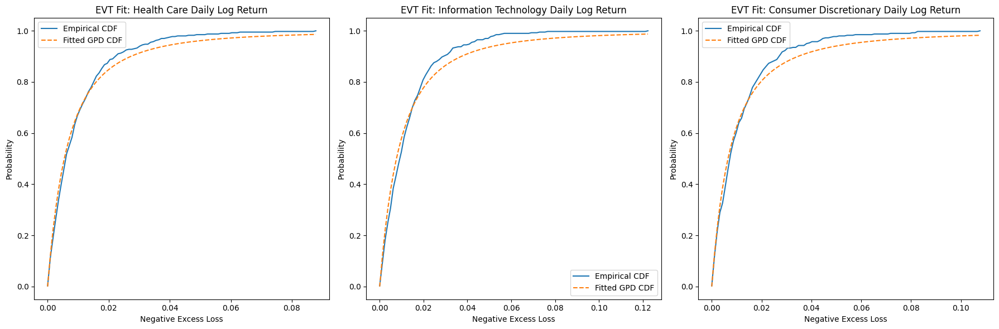

In [43]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
from statsmodels.distributions.empirical_distribution import ECDF
from scipy.stats import genpareto

# Define the sectors
sectors = ['Health Care Daily Log Return', 'Information Technology Daily Log Return', 'Consumer Discretionary Daily Log Return']


# Threshold for POT (e.g., 5th percentile)
thresholds = {sector: np.percentile(data[sector], 5) for sector in sectors}

# Fit GPD for extreme losses in each sector
gpd_params = {}
for sector in sectors:
    excess_losses = data[data[sector] < thresholds[sector]][sector] - thresholds[sector]
    shape, loc, scale = genpareto.fit(-excess_losses)  # Fit GPD
    gpd_params[sector] = {'shape': shape, 'scale': scale}
    print(f"{sector}: Shape = {shape:.4f}, Scale = {scale:.4f}")

# Plot empirical CDF and fitted GPD for each sector
plt.figure(figsize=(18, 6))

for i, sector in enumerate(sectors):
    excess_losses = data[data[sector] < thresholds[sector]][sector] - thresholds[sector]
    ecdf = ECDF(-excess_losses)
    x = np.linspace(min(-excess_losses), max(-excess_losses), 100)
    
    plt.subplot(1, 3, i + 1)
    plt.plot(x, ecdf(x), label='Empirical CDF')
    plt.plot(x, genpareto.cdf(x, *genpareto.fit(-excess_losses)), label='Fitted GPD CDF', linestyle='dashed')
    plt.xlabel("Negative Excess Loss")
    plt.ylabel("Probability")
    plt.title(f"EVT Fit: {sector}")
    plt.legend()

plt.tight_layout()
plt.show()


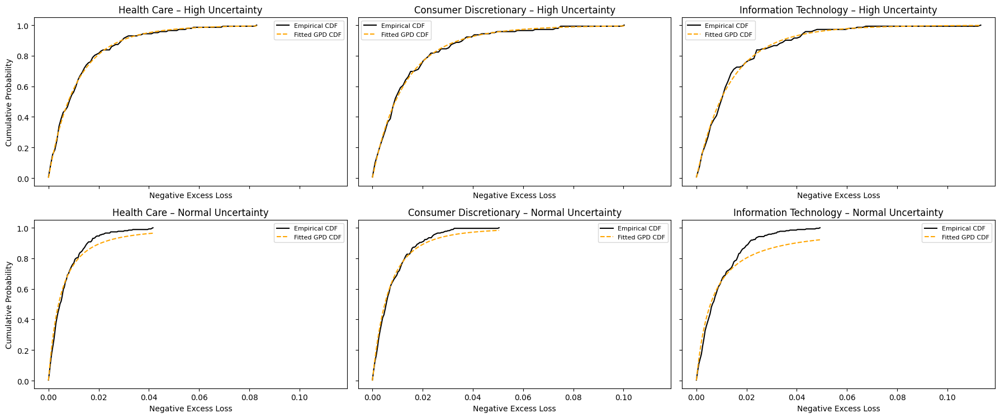

In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.distributions.empirical_distribution import ECDF
from scipy.stats import genpareto

# === CONFIG ===
sectors = [
    'Health Care Daily Log Return',
    'Consumer Discretionary Daily Log Return',
    'Information Technology Daily Log Return'
]

# === Define high uncertainty periods ===
high_uncertainty_periods = [
    ("1997-07-01", "1998-10-01"),  # Asian Financial Crisis
    ("2000-03-01", "2002-10-01"),  # Dot-Com Bubble
    ("2001-09-11", "2001-12-31"),  # 9/11
    ("2003-10-01", "2003-12-31"),  # Iraq War
    ("2007-07-01", "2009-03-01"),  # GFC
    ("2010-05-01", "2012-06-01"),  # Euro Debt Crisis
    ("2011-07-01", "2011-08-31"),  # Debt Ceiling
    ("2015-06-01", "2016-03-01"),  # China Crash & Oil
    ("2020-03-01", "2021-06-01"),  # COVID
    ("2022-01-01", "2023-06-01")   # Inflation / Rate Hikes
]

# Ensure datetime index
data.index = pd.to_datetime(data.index)
data["Uncertainty Regime"] = "Normal Uncertainty"

# Apply high uncertainty labeling
for start, end in high_uncertainty_periods:
    mask = (data.index >= start) & (data.index <= end)
    data.loc[mask, "Uncertainty Regime"] = "High Uncertainty"

# === Plot Setup ===
fig, axs = plt.subplots(2, 3, figsize=(18, 8), sharex=True, sharey=True)
fig.subplots_adjust(hspace=0.3, wspace=0.2)

# === Loop through regimes and sectors ===
for row, regime in enumerate(["High Uncertainty", "Normal Uncertainty"]):
    for col, sector in enumerate(sectors):
        subset = data[data["Uncertainty Regime"] == regime]
        threshold = np.percentile(subset[sector], 5)
        excess = subset[subset[sector] < threshold][sector] - threshold
        neg_excess = -excess

        ax = axs[row, col]

        if len(neg_excess) < 20:
            ax.text(0.5, 0.5, 'Insufficient data', ha='center', va='center')
            ax.axis('off')
            continue

        # Fit GPD
        shape, loc, scale = genpareto.fit(neg_excess)

        # Plot ECDF and GPD CDF
        ecdf = ECDF(neg_excess)
        x = np.linspace(min(neg_excess), max(neg_excess), 100)
        gpd_cdf = genpareto.cdf(x, c=shape, loc=0, scale=scale)

        ax.plot(x, ecdf(x), label="Empirical CDF", color='black')
        ax.plot(x, gpd_cdf, label="Fitted GPD CDF", linestyle='--', color='orange')
        ax.set_title(f"{sector.replace(' Daily Log Return', '')} – {regime}")
        ax.set_xlabel("Negative Excess Loss")
        if col == 0:
            ax.set_ylabel("Cumulative Probability")
        ax.legend(fontsize=8)
        ax.grid(False)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [45]:
alpha_levels = [0.95, 0.99]
cvar_results = {}

for sector in sectors:
    cvar_results[sector] = {}
    for alpha in alpha_levels:
        var = np.percentile(data[sector], 100 * (1 - alpha))  # Compute Value at Risk (VaR)
        cvar = data[data[sector] < var][sector].mean()  # Compute CVaR (Expected Shortfall)
        cvar_results[sector][f'CVaR {int(alpha*100)}%'] = cvar

# Convert to DataFrame and display
cvar_df = pd.DataFrame(cvar_results).T
print(cvar_df)


                                         CVaR 95%  CVaR 99%
Health Care Daily Log Return            -0.027113 -0.044537
Consumer Discretionary Daily Log Return -0.032690 -0.053446
Information Technology Daily Log Return -0.040391 -0.061189


In [61]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
from scipy.stats import genpareto

# Define sectors
sectors = ['Health Care Daily Log Return', 'Information Technology Daily Log Return', 'Consumer Discretionary Daily Log Return']

# Define event-based high uncertainty periods
high_uncertainty_periods = [
    ("Asian Financial Crisis", "1997-07-01", "1998-10-01"),
    ("Dot-Com Bubble", "2000-03-01", "2002-10-01"),
    ("Post-9/11 Market Shock", "2001-09-11", "2001-12-31"),
    ("Iraq War", "2003-10-01", "2003-12-31"),
    ("Global Financial Crisis", "2007-07-01", "2009-03-01"),
    ("European Debt Crisis", "2010-05-01", "2012-06-01"),
    ("US Debt Ceiling Crisis", "2011-07-01", "2011-08-31"),
    ("China Market Crash & Oil Collapse", "2015-06-01", "2016-03-01"),
    ("COVID-19 Pandemic", "2020-03-01", "2021-06-01"),
    ("2022 Inflation & Rate Hikes", "2022-01-01", "2023-06-01")
]

# Convert dates to datetime format
data.index = pd.to_datetime(data.index)

# Assign "High Uncertainty" based on event classification
data["Uncertainty Regime"] = "Normal Uncertainty"  # Default category

for _, start, end in high_uncertainty_periods:
    mask = (data.index >= pd.to_datetime(start)) & (data.index <= pd.to_datetime(end))
    data.loc[mask, "Uncertainty Regime"] = "High Uncertainty"

# Compute EVT (GPD Fit) and CVaR for each regime
evt_results = {}
cvar_results = {}

for sector in sectors:
    evt_results[sector] = {}
    cvar_results[sector] = {}

    for regime in ["Normal Uncertainty", "High Uncertainty"]:
        subset = data[data["Uncertainty Regime"] == regime][sector]
        threshold = np.percentile(subset, 5)  # 5% left tail threshold
        excess_losses = subset[subset < threshold] - threshold

        # EVT - Fit Generalized Pareto Distribution (GPD)
        if len(excess_losses) > 0:  # Ensure there are enough extreme values to fit
            shape, loc, scale = genpareto.fit(-excess_losses)
            evt_results[sector][regime] = {'Shape': shape, 'Scale': scale}
        else:
            evt_results[sector][regime] = {'Shape': np.nan, 'Scale': np.nan}

        # Compute CVaR (Expected Shortfall) for 95% and 99% levels
        cvar_95 = subset[subset < np.percentile(subset, 5)].mean()
        cvar_99 = subset[subset < np.percentile(subset, 1)].mean()
        cvar_results[sector][regime] = {'CVaR 95%': cvar_95, 'CVaR 99%': cvar_99}

# Convert to DataFrames and display results
evt_df = pd.DataFrame(evt_results).T
cvar_df = pd.DataFrame(cvar_results).T

print("Extreme Value Theory (EVT) Results:")
evt_df

Extreme Value Theory (EVT) Results:


,Normal Uncertainty,High Uncertainty
Health Care Daily Log Return,"{'Shape': 0.5006243094252472, 'Scale': 0.00483...","{'Shape': 0.1333332223091298, 'Scale': 0.01080..."
Information Technology Daily Log Return,"{'Shape': 0.7808520413735078, 'Scale': 0.00611...","{'Shape': 0.10256136971031021, 'Scale': 0.0130..."
Consumer Discretionary Daily Log Return,"{'Shape': 0.2968748643587664, 'Scale': 0.00637...","{'Shape': 0.15574773688895935, 'Scale': 0.0124..."


In [50]:
print("\nConditional Value at Risk (CVaR) Results:")
# round the values in cvar_df to 4 decimal places
np.round(cvar_df, 4)


Conditional Value at Risk (CVaR) Results:


,Normal Uncertainty,High Uncertainty
Health Care Daily Log Return,"{'CVaR 95%': -0.021820394717302242, 'CVaR 99%'...","{'CVaR 95%': -0.03476575483933618, 'CVaR 99%':..."
Information Technology Daily Log Return,"{'CVaR 95%': -0.03121209837945034, 'CVaR 99%':...","{'CVaR 95%': -0.05104196829434492, 'CVaR 99%':..."
Consumer Discretionary Daily Log Return,"{'CVaR 95%': -0.02414924465696867, 'CVaR 99%':...","{'CVaR 95%': -0.04323840968129391, 'CVaR 99%':..."


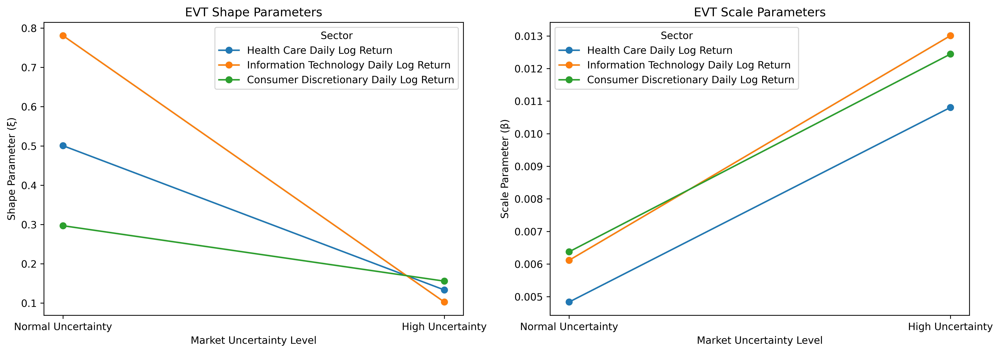

In [70]:
import matplotlib.pyplot as plt
import numpy as np

# Define market uncertainty labels for the x-axis
uncertainty_labels = ['Normal Uncertainty', 'High Uncertainty']

# Extract EVT Shape and Scale Parameters per sector
evt_shape_data = {sector: [evt_results[sector][regime]['Shape'] for regime in uncertainty_labels] for sector in sectors}
evt_scale_data = {sector: [evt_results[sector][regime]['Scale'] for regime in uncertainty_labels] for sector in sectors}

# Plot EVT Scale and Shape Parameters as subfigures (1 row x 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(14, 5), dpi=600, sharex=True)
# EVT Scale Parameter
for sector, scale_values in evt_scale_data.items():
    axes[1].plot(uncertainty_labels, scale_values, marker='o', label=sector)
axes[1].set_xlabel("Market Uncertainty Level")
axes[1].set_ylabel("Scale Parameter (β)")
axes[1].set_title("EVT Scale Parameters")
axes[1].legend(title="Sector")
axes[1].grid(False)
# EVT Shape Parameter
for sector, shape_values in evt_shape_data.items():
    axes[0].plot(uncertainty_labels, shape_values, marker='o', label=sector)
axes[0].set_xlabel("Market Uncertainty Level")
axes[0].set_ylabel("Shape Parameter (ξ)")
axes[0].set_title("EVT Shape Parameters")
axes[0].legend(title="Sector")
axes[0].grid(False)

plt.tight_layout()
plt.show()


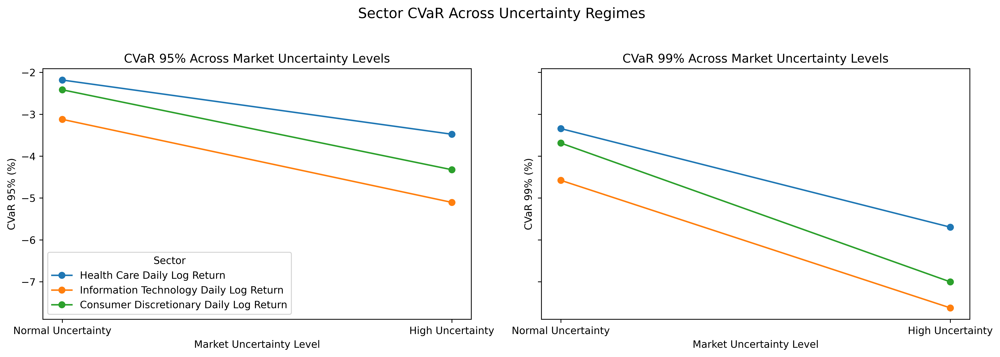

=== Conditional Value at Risk (CVaR) Summary ===

Sector: Health Care
  Normal Uncertainty: CVaR 95% = -0.0218, CVaR 99% = -0.0334
  High Uncertainty: CVaR 95% = -0.0348, CVaR 99% = -0.0570

Sector: Information Technology
  Normal Uncertainty: CVaR 95% = -0.0312, CVaR 99% = -0.0458
  High Uncertainty: CVaR 95% = -0.0510, CVaR 99% = -0.0762

Sector: Consumer Discretionary
  Normal Uncertainty: CVaR 95% = -0.0241, CVaR 99% = -0.0369
  High Uncertainty: CVaR 95% = -0.0432, CVaR 99% = -0.0700


In [71]:
import matplotlib.pyplot as plt
import numpy as np

# Define market uncertainty labels for the x-axis
uncertainty_labels = ['Normal Uncertainty', 'High Uncertainty']

cvar_95_data = {sector: [cvar_results[sector][regime]['CVaR 95%'] for regime in uncertainty_labels] for sector in sectors}
cvar_99_data = {sector: [cvar_results[sector][regime]['CVaR 99%'] for regime in uncertainty_labels] for sector in sectors}


# Create 1 row x 2 columns figure
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True, dpi=600)

# Plot CVaR 95%
for sector, cvar_values in cvar_95_data.items():
    percent_values = [v * 100 for v in cvar_values]
    axes[0].plot(uncertainty_labels, percent_values, marker='o', label=sector)
axes[0].set_title("CVaR 95% Across Market Uncertainty Levels")
axes[0].set_xlabel("Market Uncertainty Level")
axes[0].set_ylabel("CVaR 95% (%)")
axes[0].grid(False)
axes[0].legend(title="Sector")

# Plot CVaR 99%
for sector, cvar_values in cvar_99_data.items():
    percent_values = [v * 100 for v in cvar_values]
    axes[1].plot(uncertainty_labels, percent_values, marker='o', label=sector)
axes[1].set_title("CVaR 99% Across Market Uncertainty Levels")
axes[1].set_xlabel("Market Uncertainty Level")
axes[1].set_ylabel("CVaR 99% (%)")
axes[1].grid(False)

# Finalize layout
plt.suptitle("Sector CVaR Across Uncertainty Regimes", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Summary of CVaR results
print("=== Conditional Value at Risk (CVaR) Summary ===")
for sector in sectors:
    print(f"\nSector: {sector.replace(' Daily Log Return', '')}")
    for regime in ["Normal Uncertainty", "High Uncertainty"]:
        cvar_95 = cvar_results[sector][regime]['CVaR 95%']
        cvar_99 = cvar_results[sector][regime]['CVaR 99%']
        print(f"  {regime}: CVaR 95% = {cvar_95:.4f}, CVaR 99% = {cvar_99:.4f}")



In [52]:
import numpy as np
import pandas as pd

# Bootstrap function for confidence intervals
def bootstrap_cvar(cvar_results, sector, n_bootstrap=10000, ci=95):
    boot_results = {}

    for regime in ['Normal Uncertainty', 'High Uncertainty']:
        cvar_values = list(cvar_results[sector][regime].values())  # Get CVaR 95% and 99% values

        # Bootstrap resampling
        boot_means = [np.mean(np.random.choice(cvar_values, size=len(cvar_values), replace=True)) for _ in range(n_bootstrap)]

        # Compute confidence intervals
        lower_bound = np.percentile(boot_means, (100 - ci) / 2)
        upper_bound = np.percentile(boot_means, 100 - (100 - ci) / 2)

        boot_results[regime] = {'Mean': np.mean(boot_means), 'Lower CI': lower_bound, 'Upper CI': upper_bound}

    return boot_results

# Compute bootstrap confidence intervals for each sector
bootstrap_results = {sector: bootstrap_cvar(cvar_results, sector) for sector in sectors}

# Convert results to DataFrame
bootstrap_df = pd.DataFrame.from_dict(
    {(sector, regime): values for sector, regimes in bootstrap_results.items() for regime, values in regimes.items()},
    orient='index'
)

# Format DataFrame for better readability
bootstrap_df = bootstrap_df.reset_index().rename(columns={'level_0': 'Sector', 'level_1': 'Market Uncertainty'})
bootstrap_df = bootstrap_df[['Sector', 'Market Uncertainty', 'Mean', 'Lower CI', 'Upper CI']]

# Display the formatted table
import tabulate
print(tabulate.tabulate(bootstrap_df, headers='keys', tablefmt='grid'))


+----+-----------------------------------------+----------------------+------------+------------+------------+
|    | Sector                                  | Market Uncertainty   |       Mean |   Lower CI |   Upper CI |
+====+=========================================+======================+============+============+============+
|  0 | Health Care Daily Log Return            | Normal Uncertainty   | -0.0276042 | -0.0334229 | -0.0218204 |
+----+-----------------------------------------+----------------------+------------+------------+------------+
|  1 | Health Care Daily Log Return            | High Uncertainty     | -0.0457923 | -0.0569587 | -0.0347658 |
+----+-----------------------------------------+----------------------+------------+------------+------------+
|  2 | Information Technology Daily Log Return | Normal Uncertainty   | -0.0384505 | -0.0457734 | -0.0312121 |
+----+-----------------------------------------+----------------------+------------+------------+------------+
|